In [1]:
import pandas as pd
import pandas_profiling as pp
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import xgboost as xgb

In [2]:
df = pd.read_csv('Updated_Frame_2.csv')
df.head()

,Location_type,zone,WH_regional_zone,num_refill_req_l3m,Competitor_in_mkt,Comp_Ref_Ratio,Ware_house_ID,WH_Manager_ID,WH_capacity_size,transport_issue_l1y,...,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,Prop_Demand_E_Pk,age
0,Rural,East,Zone 1,6,6,1.142857,WH_119397,EID_69397,Small,1,...,34.0,2009.0,20,1,A+,3,16,25139,0.216216,14.0
1,Rural,East,Zone 1,6,6,1.142857,WH_122017,EID_72017,Small,1,...,18.0,NaN,14,0,B+,6,16,16088,0.216216,NaN
2,Rural,East,Zone 1,6,3,1.600000,WH_115101,EID_65101,Small,0,...,22.0,NaN,4,1,C,3,31,5060,0.216216,NaN
3,Rural,East,Zone 1,6,4,1.600000,WH_104017,EID_54017,Small,0,...,NaN,2020.0,8,0,B+,2,31,9131,0.216216,3.0
4,Rural,East,Zone 1,6,5,2.000000,WH_103234,EID_53234,Small,0,...,40.0,2011.0,19,0,B+,2,31,22130,0.216216,12.0


In [24]:
profile = pp.ProfileReport(df)

In [25]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
num_cols = [col for col in df.columns if df[col].dtypes in ['int64', 'int32', 'float64'] and col not in ['product_wg_ton']]
num_cols

['num_refill_req_l3m',
 'Competitor_in_mkt',
 'Comp_Ref_Ratio',
 'transport_issue_l1y',
 'retail_shop_num',
 'distributor_num',
 'flood_impacted',
 'flood_proof',
 'electric_supply',
 'dist_from_hub',
 'workers_num',
 'wh_est_year',
 'storage_issue_reported_l3m',
 'temp_reg_mach',
 'wh_breakdown_l3m',
 'govt_check_l3m',
 'Prop_Demand_E_Pk',
 'age']

In [31]:
df.dropna(axis=0, inplace=True)
for x in num_cols:
    new_variable_01 = '{}_num_refill_req_l3m'.format(x)
    new_variable_02 = '{}_Comp_Ref_Ratio'.format(x)
    new_variable_03 = '{}_retail_shop_num'.format(x)
    new_variable_04 = '{}_dist_from_hub'.format(x)
    new_variable_05 = '{}Competitor_in_mkt'.format(x)
    df.loc[:, new_variable_01] = df[x] * df['num_refill_req_l3m']
    df.loc[:, new_variable_02] = df[x] * df['Comp_Ref_Ratio'].astype('int64')
    df.loc[:, new_variable_03] = df[x] * df['retail_shop_num']
    df.loc[:, new_variable_04] = df[x] * df['dist_from_hub']
    df.loc[:, new_variable_05] = df[x] * df['Competitor_in_mkt']

In [32]:
df.head()

,Location_type,zone,WH_regional_zone,num_refill_req_l3m,Competitor_in_mkt,Comp_Ref_Ratio,Ware_house_ID,WH_Manager_ID,WH_capacity_size,transport_issue_l1y,...,govt_check_l3m_num_refill_req_l3m,govt_check_l3m_Comp_Ref_Ratio,govt_check_l3m_retail_shop_num,govt_check_l3m_dist_from_hub,govt_check_l3mCompetitor_in_mkt,Prop_Demand_E_Pk_num_refill_req_l3m,Prop_Demand_E_Pk_Comp_Ref_Ratio,Prop_Demand_E_Pk_retail_shop_num,Prop_Demand_E_Pk_dist_from_hub,Prop_Demand_E_PkCompetitor_in_mkt
0,Rural,East,Zone 1,6,6,1.142857,WH_119397,EID_69397,Small,1,...,96,16,99504,3920,96,1.297297,0.216216,1344.648649,52.972973,1.297297
4,Rural,East,Zone 1,6,5,2.000000,WH_103234,EID_53234,Small,0,...,186,62,173507,3069,155,1.297297,0.432432,1210.162162,21.405405,1.081081
7,Rural,East,Zone 1,6,8,2.000000,WH_123234,EID_73234,Small,4,...,186,62,143003,8215,248,1.297297,0.432432,997.405405,57.297297,1.729730
14,Rural,East,Zone 1,4,4,1.200000,WH_100086,EID_50086,Small,0,...,124,31,141484,4960,124,0.648649,0.162162,740.108108,25.945946,0.648649
18,Rural,East,Zone 1,4,8,1.500000,WH_118118,EID_68118,Small,0,...,64,16,58928,4336,128,0.648649,0.162162,597.243243,43.945946,1.297297


In [58]:
df.columns.tolist()

['Ware_house_ID',
 'WH_Manager_ID',
 'Location_type',
 'WH_capacity_size',
 'zone',
 'WH_regional_zone',
 'num_refill_req_l3m',
 'transport_issue_l1y',
 'Competitor_in_mkt',
 'retail_shop_num',
 'wh_owner_type',
 'distributor_num',
 'flood_impacted',
 'flood_proof',
 'electric_supply',
 'dist_from_hub',
 'workers_num',
 'wh_est_year',
 'storage_issue_reported_l3m',
 'temp_reg_mach',
 'approved_wh_govt_certificate',
 'wh_breakdown_l3m',
 'govt_check_l3m',
 'product_wg_ton']

In [69]:
df.dropna(axis=0, inplace=True)

In [70]:
cat_cols = [col for col in df.columns if df[col].dtypes == 'object']
cat_cols

['Location_type',
 'zone',
 'WH_regional_zone',
 'Ware_house_ID',
 'WH_Manager_ID',
 'WH_capacity_size',
 'wh_owner_type',
 'approved_wh_govt_certificate']

In [71]:
for col in cat_cols:
    le = LabelEncoder()
    df.loc[:, col] = le.fit_transform(df[col])

In [72]:
X = df.drop('product_wg_ton', axis=1)
y = df['product_wg_ton']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [73]:
xgb_regressor = xgb.XGBRegressor()
xgb_regressor.fit(X_train, y_train)
y_pred = xgb_regressor.predict(X_test)

In [74]:
score = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)

In [75]:
print(score)
print(mse)
print(mae)
print(rmse)

0.9944156675378915
761774.5468061472
679.7638944797249
872.7969676884466


<AxesSubplot:>

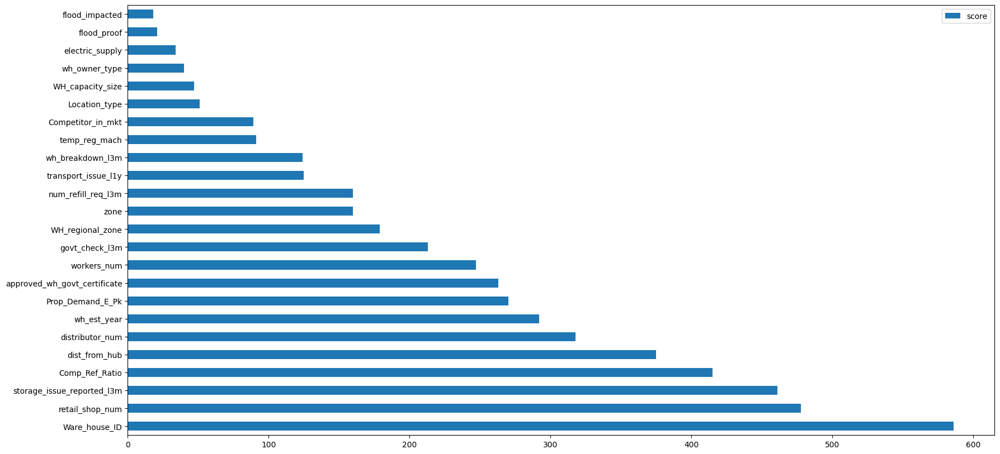

In [76]:
feature_important = xgb_regressor.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(50, columns="score").plot(kind='barh', figsize = (20, 10))